# Example 2: Four square loops

This example demonstrates using groups to simplify repetitive structures.

Load the module.

In [1]:
using FastHenryHelper

┌ Info: Precompiling FastHenryHelper [075fbb30-7a8a-11e8-208e-7feee39ec577]
└ @ Base loading.jl:1186


Create a group for one square loop 10mm on a side.

In [2]:
n1 = Node(0,0,0)
n2 = Node(10,0,0)
n3 = Node(10,10,0)
n4 = Node(0,10,0)
n5 = Node(0,1,0) # leave a 1mm gap for the port
squareloop = Group(
    elements=[
        Comment("loop start"),
        n1, n2, n3, n4, n5, 
        connectnodes([n1,n2,n3,n4,n5], SegmentParameters(h=0.5, w=1.5))...,
        Comment("loop end")
    ],
    terms = Dict(:a=>n1,:b=>n5) # ports will be between :a and :b
)
        

* loop start
N_1 x=0.000000000e+00 y=0.000000000e+00 z=0.000000000e+00
N_2 x=1.000000000e+01 y=0.000000000e+00 z=0.000000000e+00
N_3 x=1.000000000e+01 y=1.000000000e+01 z=0.000000000e+00
N_4 x=0.000000000e+00 y=1.000000000e+01 z=0.000000000e+00
N_5 x=0.000000000e+00 y=1.000000000e+00 z=0.000000000e+00
E_6 N_1 N_2
+  w=1.500000000e+00 h=5.000000000e-01
E_7 N_2 N_3
+  w=1.500000000e+00 h=5.000000000e-01
E_8 N_3 N_4
+  w=1.500000000e+00 h=5.000000000e-01
E_9 N_4 N_5
+  w=1.500000000e+00 h=5.000000000e-01
* loop end


Create an array of four square loops, each one shifted 10mm on z axis.

In [3]:
loops = Array{Group}(undef,4)
z = [0.0, 10.0, 20.0, 30.0]
for i in eachindex(loops)
    loops[i] = transform(squareloop, txyz(0,0,z[i]))
end

Create the top level group.

In [4]:
fourloops = Group(
    elements=[
        Comment("Four loops 10mm on a side offset by 10mm in z"),
        Units("mm"),
        Comment(""),
        Comment("sigma for copper, 25 filiments per segment"),
        Default(sigma=62.1e6*1e-3, nwinc=5, nhinc=5),
        Comment(""),
        Comment("the loops"),
        loops...,
        Comment(""),
        Comment("define three ports"),
        External(loops[3][:b],loops[4][:b],"port_1"),
        External(loops[2][:a],loops[2][:b],"port_2"),
        External(loops[1][:a],loops[1][:b],"port_3"),
        Comment(""),
        Comment("define frequencies"),
        Freq(min=1e-1, max=1e9, ndec=0.05),
        Comment(""),
        Comment("always need end"),
        End()
    ]
)

* Four loops 10mm on a side offset by 10mm in z
.units mm
* 
* sigma for copper, 25 filiments per segment
.default
+  nhinc=5 nwinc=5
+  sigma=6.210000000e+04
* 
* the loops
* loop start
N_1 x=0.000000000e+00 y=0.000000000e+00 z=0.000000000e+00
N_2 x=1.000000000e+01 y=0.000000000e+00 z=0.000000000e+00
N_3 x=1.000000000e+01 y=1.000000000e+01 z=0.000000000e+00
N_4 x=0.000000000e+00 y=1.000000000e+01 z=0.000000000e+00
N_5 x=0.000000000e+00 y=1.000000000e+00 z=0.000000000e+00
E_6 N_1 N_2
+  w=1.500000000e+00 h=5.000000000e-01
+  wx=0.000000000e+00 wy=1.000000000e+00 wz=0.000000000e+00
E_7 N_2 N_3
+  w=1.500000000e+00 h=5.000000000e-01
+  wx=-1.000000000e+00 wy=0.000000000e+00 wz=0.000000000e+00
E_8 N_3 N_4
+  w=1.500000000e+00 h=5.000000000e-01
+  wx=0.000000000e+00 wy=-1.000000000e+00 wz=0.000000000e+00
E_9 N_4 N_5
+  w=1.500000000e+00 h=5.000000000e-01
+  wx=1.000000000e+00 wy=0.000000000e+00 wz=0.000000000e+00
* loop end
* loop start
N_10 x=0.000000000e+00 y=0.000000000e+00 z=1.00000000

Plot of `fourloops`

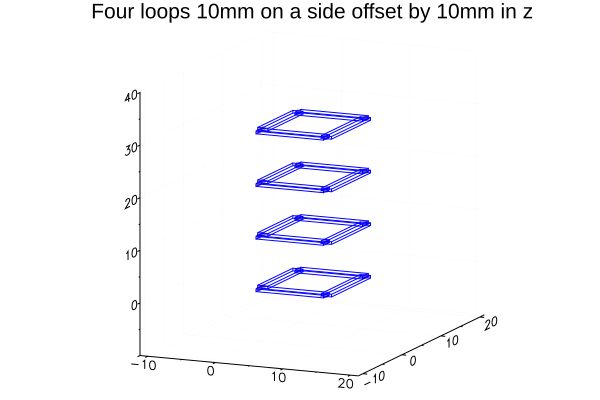

In [5]:
using Plots
gr()  #  use plotlyjs() or plotly() for interactive plot
plot(fourloops)

Write fourloops to file.

In [6]:
open("fourloops.inp","w") do io
    show(io,fourloops)
end